In [11]:
import cv2
import matplotlib.pyplot as plt
import deepdish as dd
import numpy as np
import random

data = dd.io.load("dataset/fabric_pose.h5")

X, Y = data["X"], data["Y"]
X, Y = np.array(X), np.array(Y)
X.shape



# Y[:,2] /= 90.

(10000, 90, 120, 3)

In [12]:
Y_theta = np.hstack([Y, np.cos(Y[:,[2]] / 180. * np.pi)])
Y_theta[:, 2] = np.sin(Y_theta[:, 2] / 180. * np.pi)

N = int(X.shape[0] * 0.8)
X_train, Y_train = X[:N], Y_theta[:N]
X_test, Y_test = X[N:], Y_theta[N:]

In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F


class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.conv3 = nn.Conv2d(16, 32, 5)
#         self.conv4 = nn.Conv2d(32, 128, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(32 * 7 * 11, 512)
#         self.fc1 = nn.Linear(128 * 1 * 3, 120)
        self.fc2 = nn.Linear(512, 128)
        self.fc3 = nn.Linear(128, 4)

    def forward(self, x):
        x = x.permute(0, 3, 1, 2)
        x = torch.tanh(self.conv1(x))
        x = self.pool(x)
        x = torch.tanh(self.conv2(x))
        x = self.pool(x)
        x = torch.tanh(self.conv3(x))
        x = self.pool(x)
#         x = self.pool(torch.tanh(self.conv4(x)))
#         x = x.permute(0, 2, 3, 1)
#         print(x.size())
        x = x.reshape(-1, 32 * 7 * 11)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

    def fit(self, X_train, Y_train, device):
        batch_size = 32
        N = X_train.shape[0]


        optim = torch.optim.Adam(self.parameters(), lr=0.0005)
        sum_loss = 0
        total = 0

        sum_loss = 0
        total = 0
        
        for epoch in range(100):
            
            if epoch % 5 == 0:
                idx = list(range(N))
                random.shuffle(idx)

                X_train = X_train[idx]
                Y_train = Y_train[idx]
        
            for i in range(N // batch_size):
                # clear gradients accumulated on the parameters
                optim.zero_grad()

                # get an input (say we only care inputs sampled from N(0, I))
                # x = torch.randn(batch_size, 8, device=cuda0)  # this has to be on GPU too
                x = torch.tensor(
                    X_train[i * batch_size : (i + 1) * batch_size], dtype=torch.float32
                ).to(device)
                y = torch.tensor(
                    Y_train[i * batch_size : (i + 1) * batch_size], dtype=torch.float32
                ).to(device)

                # forward pass
                result = self.forward(x)  # CHANGED: fc => net

                # compute loss
                loss = F.mse_loss(result, y)

                # compute gradients
                loss.backward()

                # let the optimizer do its work; the parameters will be updated in this call
                optim.step()

                sum_loss += loss.item()
                total += 1
                # add some printing
            if (epoch + 1) % 1 == 0:
                print(
                    "epoch {}\titeration {}\tloss {:.5f}".format(
                        epoch, i, sum_loss / total
                    )
                )

    def predict(self, X_test, device):
        with torch.no_grad():
            return self.forward(torch.tensor(X_test, dtype=torch.float32).to(device)).cpu().numpy()


device = torch.device("cuda:0")
        
net = Net().to(device)
net.fit(X_train, Y_train, device)

# x = torch.tensor(X[:5], dtype=torch.float32).to(device)
# y = net(x)
# print(y.size())

epoch 0	iteration 249	loss 0.16174
epoch 1	iteration 249	loss 0.11907
epoch 2	iteration 249	loss 0.08551
epoch 3	iteration 249	loss 0.06672
epoch 4	iteration 249	loss 0.05469
epoch 5	iteration 249	loss 0.04637
epoch 6	iteration 249	loss 0.04023
epoch 7	iteration 249	loss 0.03553
epoch 8	iteration 249	loss 0.03182
epoch 9	iteration 249	loss 0.02881
epoch 10	iteration 249	loss 0.02635
epoch 11	iteration 249	loss 0.02426
epoch 12	iteration 249	loss 0.02247
epoch 13	iteration 249	loss 0.02094
epoch 14	iteration 249	loss 0.01960
epoch 15	iteration 249	loss 0.01845
epoch 16	iteration 249	loss 0.01742
epoch 17	iteration 249	loss 0.01651
epoch 18	iteration 249	loss 0.01570
epoch 19	iteration 249	loss 0.01497
epoch 20	iteration 249	loss 0.01429
epoch 21	iteration 249	loss 0.01368
epoch 22	iteration 249	loss 0.01311
epoch 23	iteration 249	loss 0.01259
epoch 24	iteration 249	loss 0.01212
epoch 25	iteration 249	loss 0.01168
epoch 26	iteration 249	loss 0.01127
epoch 27	iteration 249	loss 0.01089
ep

In [24]:

net.fit(X_train, Y_train, device)

epoch 0	iteration 249	loss 0.00006
epoch 1	iteration 249	loss 0.00007
epoch 2	iteration 249	loss 0.00008
epoch 3	iteration 249	loss 0.00008
epoch 4	iteration 249	loss 0.00008
epoch 5	iteration 249	loss 0.00008
epoch 6	iteration 249	loss 0.00007
epoch 7	iteration 249	loss 0.00007
epoch 8	iteration 249	loss 0.00007
epoch 9	iteration 249	loss 0.00007
epoch 10	iteration 249	loss 0.00020
epoch 11	iteration 249	loss 0.00020
epoch 12	iteration 249	loss 0.00019
epoch 13	iteration 249	loss 0.00018
epoch 14	iteration 249	loss 0.00017
epoch 15	iteration 249	loss 0.00017
epoch 16	iteration 249	loss 0.00016
epoch 17	iteration 249	loss 0.00015
epoch 18	iteration 249	loss 0.00015
epoch 19	iteration 249	loss 0.00014
epoch 20	iteration 249	loss 0.00013
epoch 21	iteration 249	loss 0.00013
epoch 22	iteration 249	loss 0.00012
epoch 23	iteration 249	loss 0.00012
epoch 24	iteration 249	loss 0.00012
epoch 25	iteration 249	loss 0.00012
epoch 26	iteration 249	loss 0.00012
epoch 27	iteration 249	loss 0.00011
ep

[0.44908866 0.5018096  0.6615136  0.74619174] [0.44031801 0.50508517 0.65368274 0.75676871]


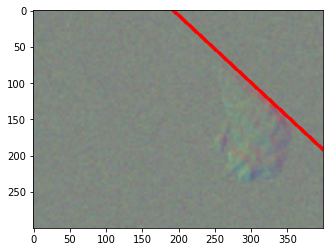

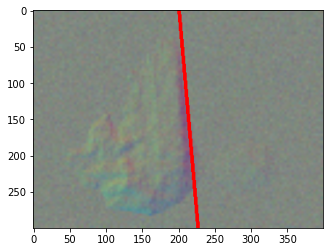

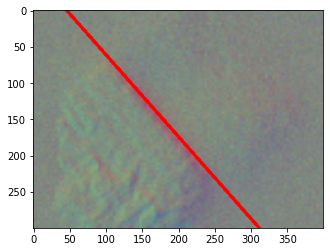

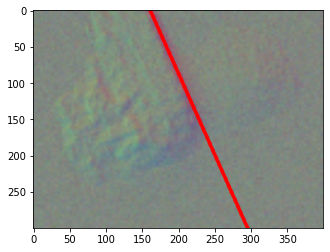

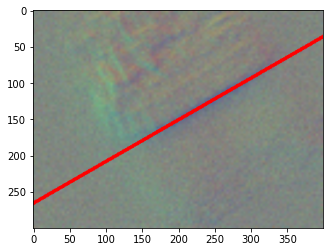

...

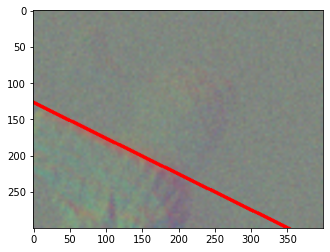

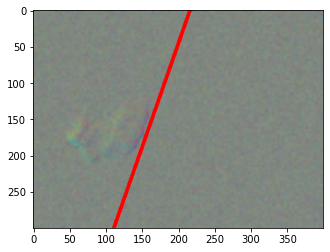

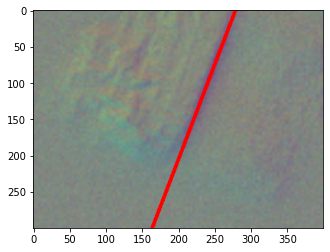

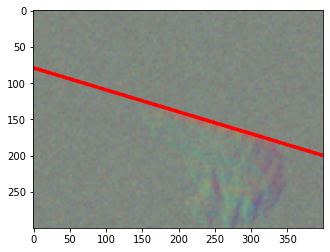

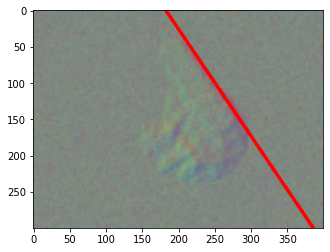

In [27]:
Y_pred = net.predict(X_test, device)
i = 2
print(Y_pred[i], Y_test[i])


def draw_line(img, theta, x0, y0):
    theta = theta / 180. * np.pi
    img = img.copy()
    rows, cols = img.shape[:2]
    
    center = np.array([x0 * cols, y0 * rows])
    
    d = 1100
    
    start_point = center + (d * np.sin(theta), d * np.cos(theta))
    end_point = center - (d * np.sin(theta), d * np.cos(theta))
    
    start_point = tuple(start_point.astype(np.int))
    end_point = tuple(end_point.astype(np.int))

    color = (0, 0, 1)
    thickness = 4
    
    img = cv2.line(img, start_point, end_point, color, thickness) 
    return img


def imshow(im, vmin=0, vmax=1):
    plt.imshow(im[:,:,::-1], vmax=vmax, vmin=vmin)
    plt.show()
    
for i in range(30):
    x, y = X_test[i], Y_pred[i]
    x = cv2.resize(x, (400, 300))
    theta = np.arctan2(y[2], y[3])
    rendered_img_line = draw_line(x, theta/np.pi*180., y[0], y[1])
    imshow(rendered_img_line)

In [9]:
frames = dd.io.load("data/fabric2.h5")

In [17]:
len(frames)

689

[0.6982142  0.4876205  0.12179139 0.9252924 ]


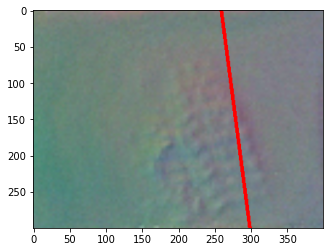

[0.6773975  0.4045877  0.27904558 0.8947631 ]


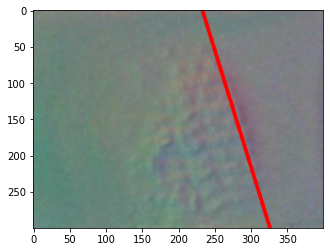

[0.6536688  0.38998255 0.2843326  0.86379886]


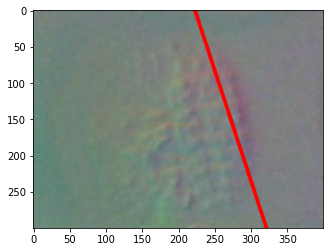

[0.61301553 0.44363472 0.0189559  0.9103992 ]


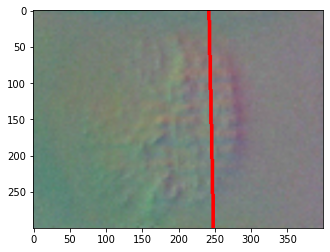

[0.6215528  0.4344381  0.04288668 0.92553973]


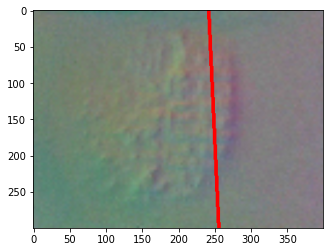

[ 0.6394341   0.45126894 -0.15554035  0.9423889 ]


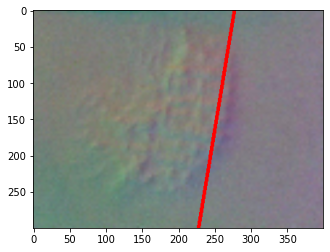

[ 0.6128632   0.49030536 -0.3471182   0.8766707 ]


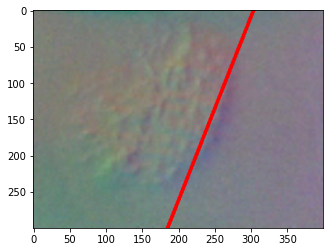

[ 0.590396    0.46772283 -0.3295828   0.85764253]


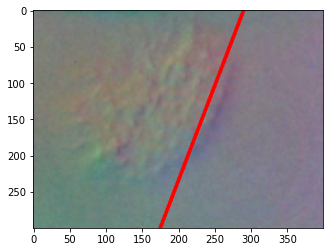

[ 0.5149343  0.4574288 -0.4412726  0.8490201]


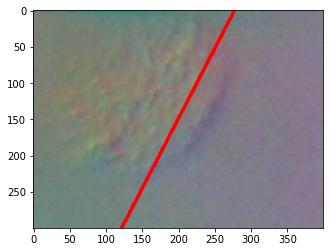

[ 0.5181673   0.4228641  -0.41833067  0.85302365]


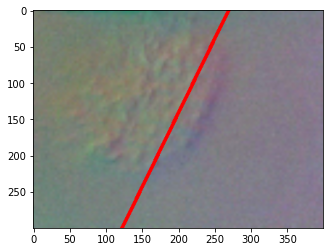

[ 0.522524    0.40382963 -0.23047706  0.92269886]


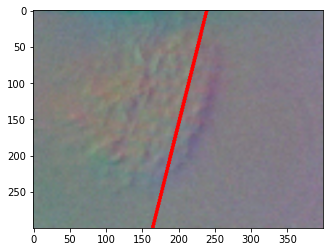

[ 0.5255251   0.40412027 -0.06159173  0.92110753]


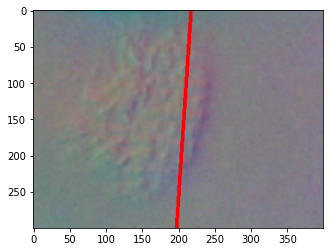

[0.5215111  0.37230864 0.16084091 0.9120066 ]


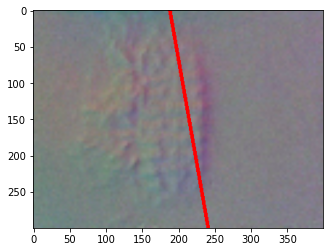

[0.558624   0.41379887 0.22962601 0.94276595]


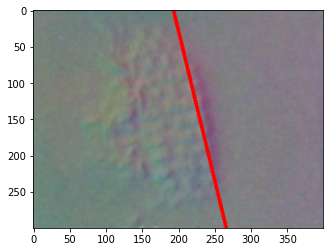

[0.5610212  0.43616375 0.31094468 0.87525713]


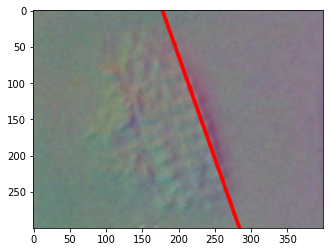

[0.54866904 0.45739323 0.46772224 0.8118106 ]


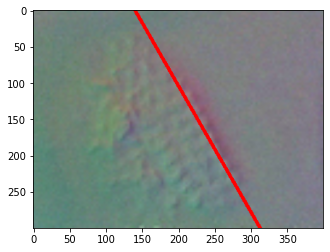

[0.5381309  0.45119494 0.53375024 0.7806164 ]


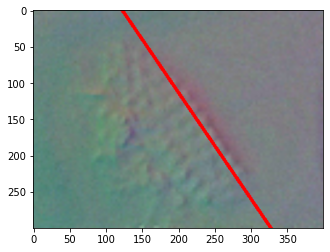

[0.5201756  0.44710818 0.59566325 0.64769304]


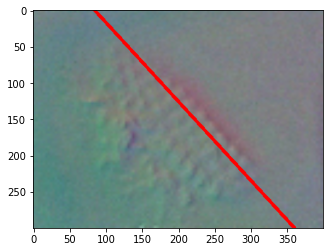

[0.54710793 0.50366944 0.5386176  0.63015133]


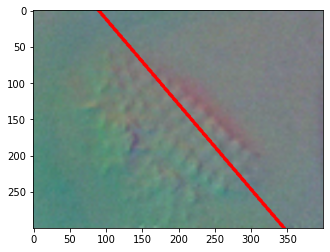

[0.54014504 0.46991473 0.6203557  0.6122664 ]


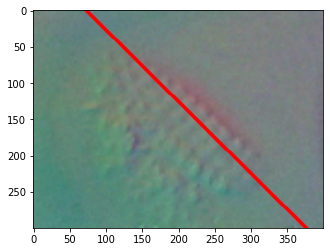

[0.5163314 0.382551  0.5725817 0.7061573]


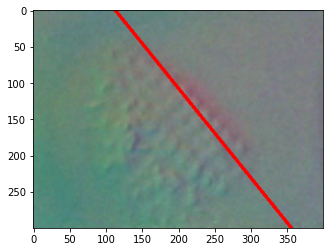

[0.5132761  0.40892115 0.20210291 0.8122799 ]


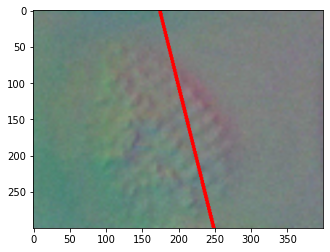

[0.50365955 0.4282205  0.24300879 0.860139  ]


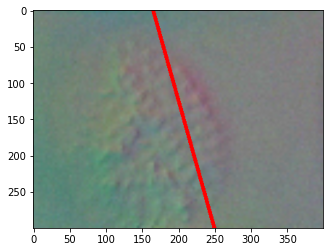

[0.51062995 0.41497162 0.22467759 0.89846003]


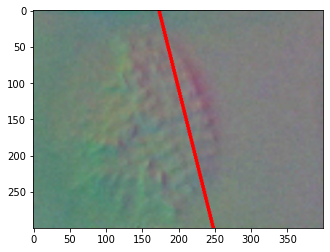

[0.4933408  0.39667064 0.10704347 0.8855785 ]


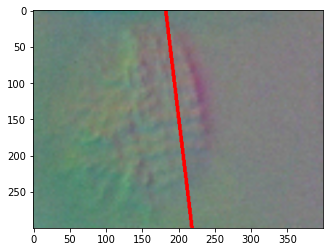

[ 0.54298496  0.3809218  -0.01805138  0.9017396 ]


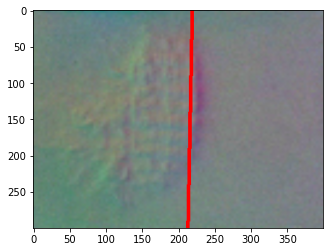

[ 0.5480465   0.39007425 -0.14211528  0.9208026 ]


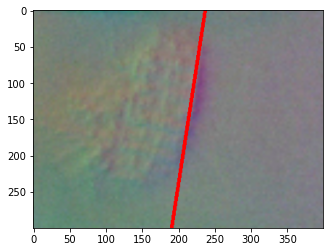

[ 0.54011077  0.40775013 -0.26798826  0.92667246]


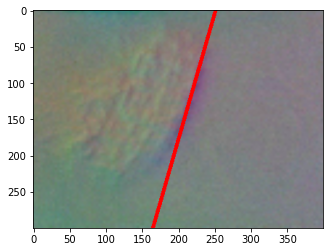

[ 0.5065819   0.34536183 -0.18767446  0.84354186]


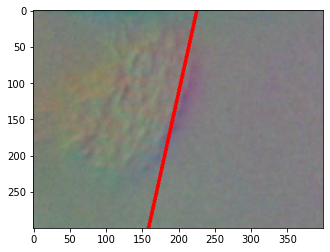

[ 0.48472455  0.37960947 -0.04734115  0.88115764]


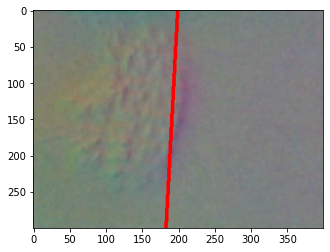

[0.49653685 0.32364997 0.0988574  0.953449  ]


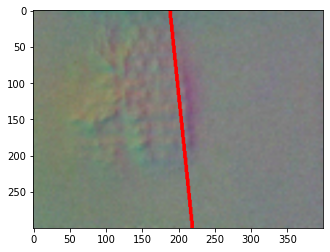

[0.46191487 0.27522928 0.14211239 0.76820076]


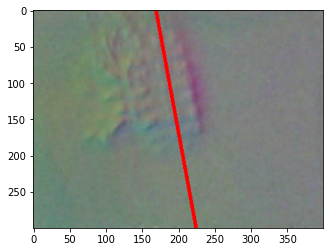

[0.494142   0.2792742  0.21190214 0.940176  ]


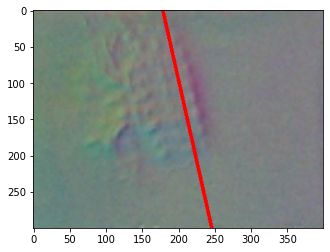

[0.46644354 0.27112657 0.1681265  0.8394712 ]


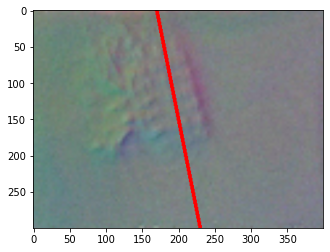

[0.5183137  0.26439777 0.18120591 0.91534173]


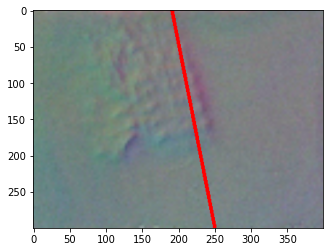

[0.5334139  0.31166273 0.04161348 0.90406215]


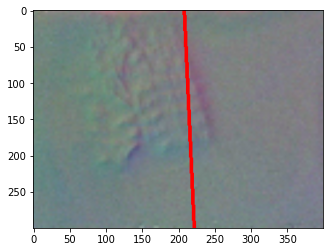

[0.54074264 0.31624    0.04158092 0.7860415 ]


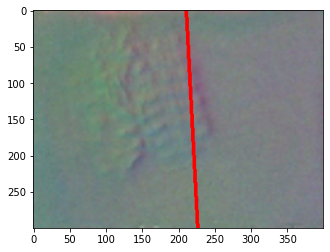

[0.5403591  0.27805212 0.29810855 0.8898816 ]


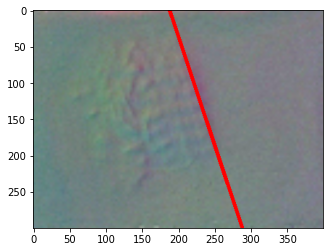

[0.54197985 0.33937934 0.19498509 0.8874401 ]


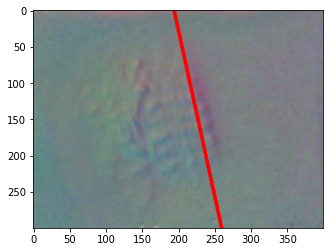

[0.5072371  0.32796755 0.2554075  0.8881943 ]


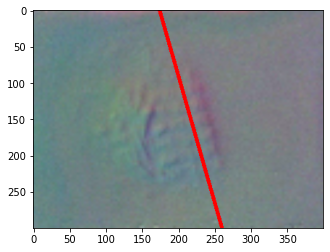

[0.5428172  0.34735554 0.22384916 0.8968103 ]


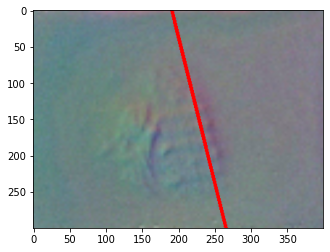

[0.54292655 0.36866844 0.23189193 0.8972815 ]


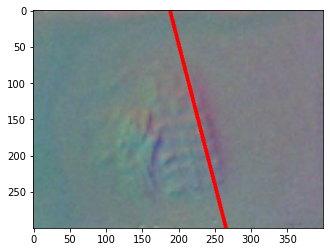

[0.51561534 0.32188427 0.2720885  0.89210546]


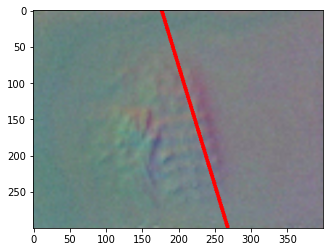

[0.54130685 0.30467784 0.28328338 0.9009739 ]


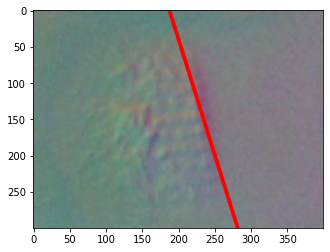

[0.5342045  0.3064273  0.28306854 0.90326536]


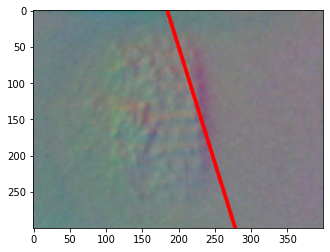

[0.5485831  0.30864182 0.0514501  0.8941703 ]


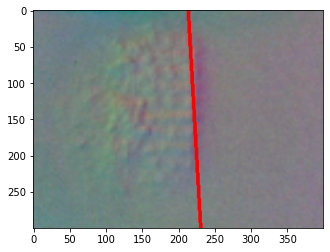

[ 0.5355517   0.33892718 -0.09939263  0.93806183]


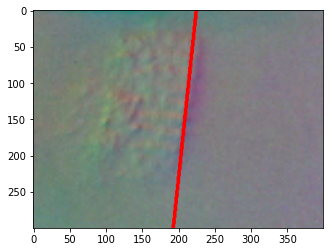

[ 0.48875982  0.41795892 -0.3465274   0.8986025 ]


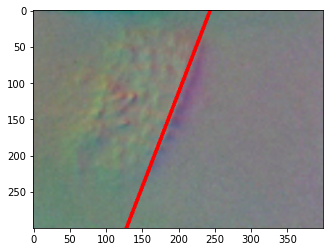

[ 0.45805728  0.44722897 -0.6086944   0.7397972 ]


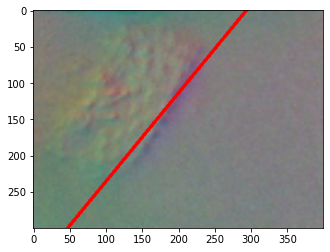

[ 0.44295916  0.42884976 -0.6740954   0.68827003]


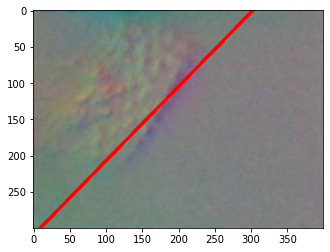

[ 0.42844257  0.43458483 -0.7073857   0.6518084 ]


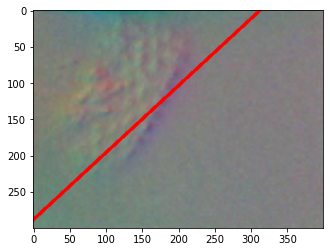

[ 0.44225323  0.44886544 -0.5364706   0.75281143]


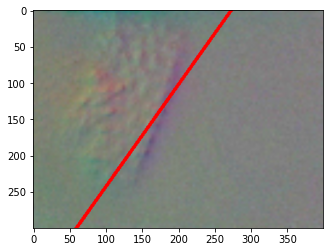

[ 0.43593052  0.4275069  -0.0181301   0.9208704 ]


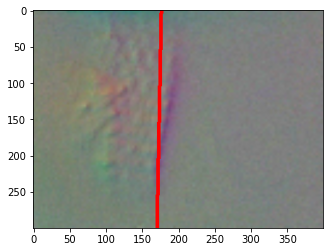

[0.47947577 0.4086203  0.15312926 0.91809905]


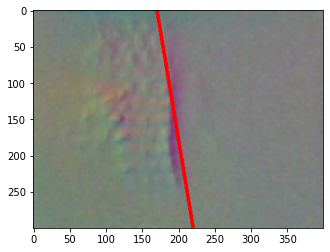

[0.49700356 0.45250952 0.19669782 0.94835436]


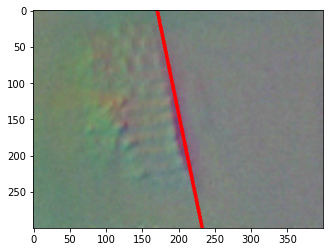

[0.5005672  0.43375266 0.3419616  0.8854368 ]


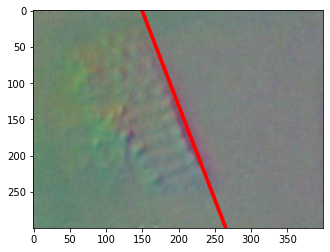

[0.493885  0.3866542 0.4259285 0.822911 ]


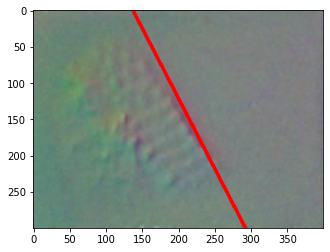

[0.48451784 0.37493703 0.46911097 0.7688402 ]


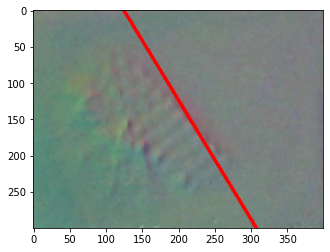

[0.46091536 0.36755896 0.51044685 0.73114586]


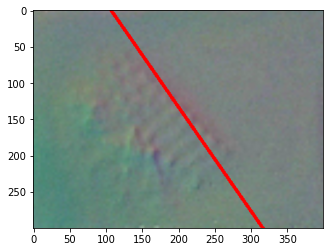

[0.46766979 0.40405542 0.5994121  0.6530247 ]


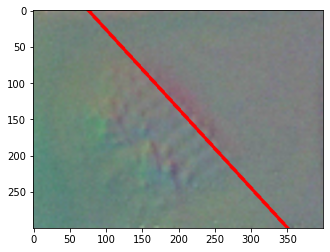

[0.508231   0.4101648  0.61082006 0.73613083]


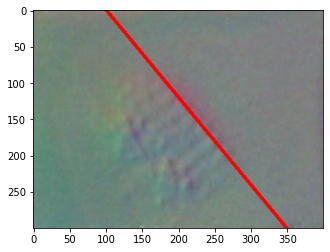

[0.537009   0.44321644 0.65974754 0.6334828 ]


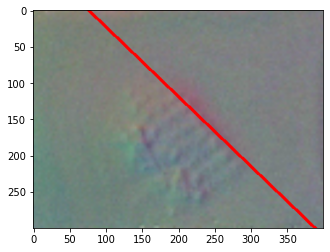

[0.5433285  0.43274432 0.64041775 0.6297699 ]


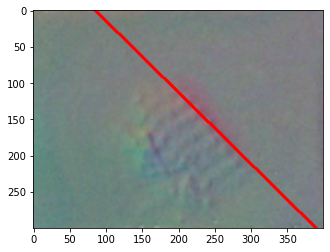

[0.55691195 0.3941999  0.5052423  0.7454809 ]


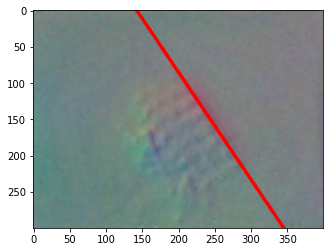

[0.543506   0.32957843 0.54713714 0.76105046]


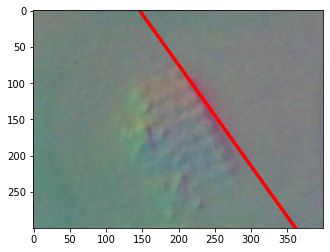

[0.54161775 0.31271017 0.4876488  0.8051286 ]


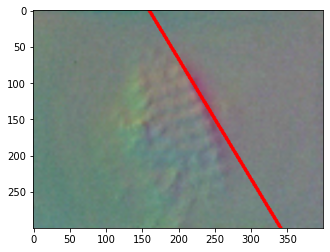

[0.5486465  0.34387243 0.30922222 0.8625032 ]


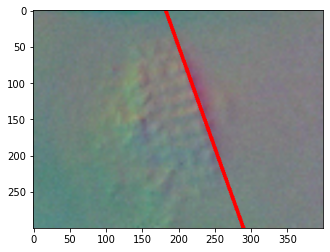

[0.54126716 0.33222836 0.24881838 0.8797214 ]


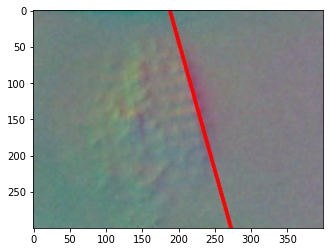

[0.55061483 0.34284818 0.11523303 0.9699259 ]


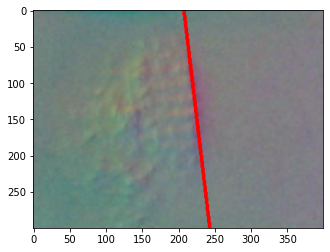

[ 0.5487946   0.34796825 -0.04766522  0.9673947 ]


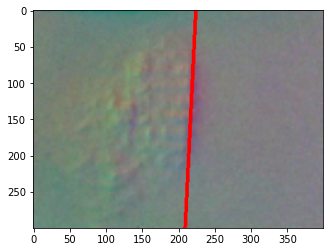

[ 0.5319177   0.35984415 -0.12884776  0.9614719 ]


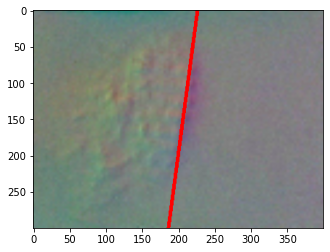

[ 0.5414276   0.39110252 -0.22643368  0.9409597 ]


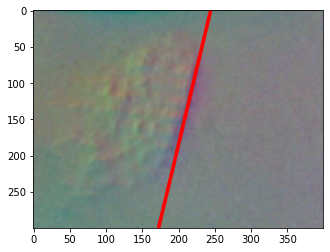

[ 0.53822994  0.37920606 -0.24113049  0.9301536 ]


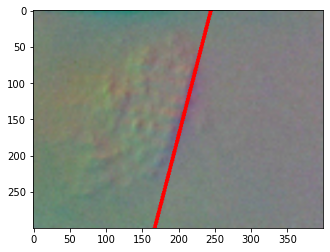

[ 0.5182196   0.37565282 -0.27762923  0.86839986]


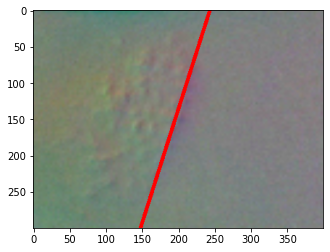

[ 0.52652085  0.39776596 -0.37534717  0.6789797 ]


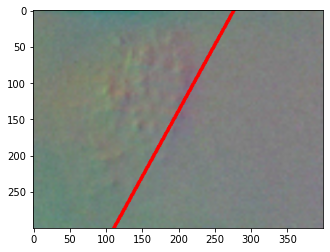

[ 0.5032182   0.43876123 -0.6035208   0.6097724 ]


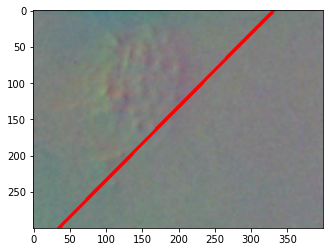

[ 0.51295066  0.43694866 -0.7202999   0.5781697 ]


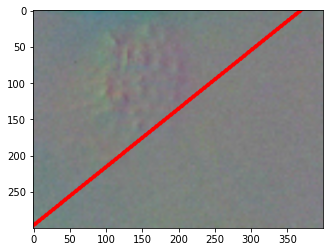

[ 0.5276246   0.40382665 -0.8047409   0.49687022]


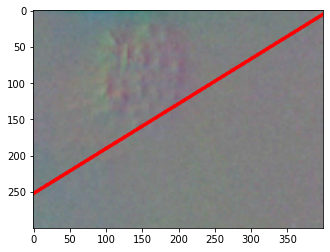

[ 0.5051271   0.42606992 -0.75269705  0.5402156 ]


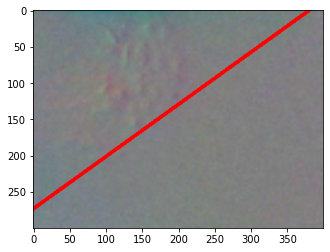

[ 0.4682751   0.42507985 -0.5569108   0.62494457]


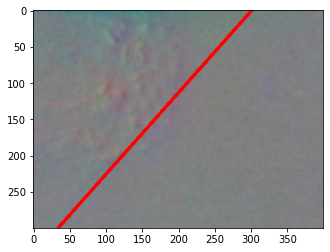

[ 0.49833608  0.3859424  -0.3019414   0.72328484]


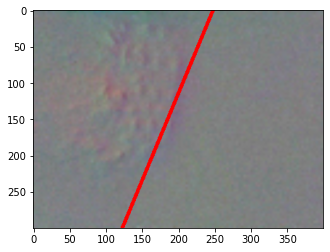

[ 0.506488    0.3601604  -0.17713425  0.783774  ]


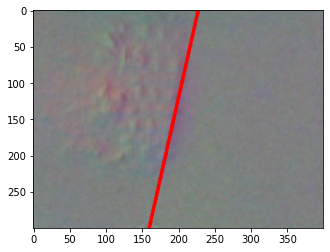

[ 0.49599707  0.4046284  -0.06807859  0.9397454 ]


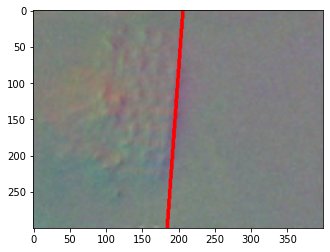

[ 0.43627444  0.5073327  -0.19110253  0.9174361 ]


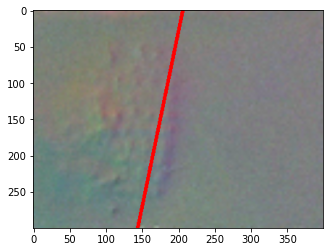

[ 0.42390645  0.4981029  -0.07078236  0.93602073]


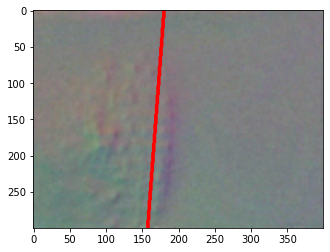

[0.4325026  0.4846509  0.08786132 0.90482557]


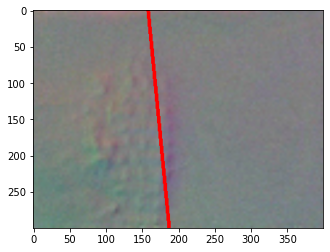

[0.46114105 0.528785   0.01199172 0.95448875]


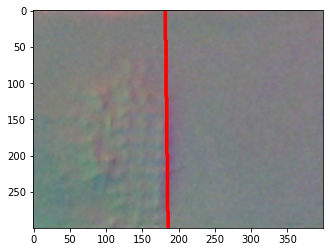

[0.455246   0.5337766  0.12745264 0.94898   ]


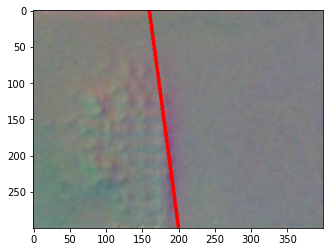

[0.4603641  0.57759583 0.23284678 0.92236793]


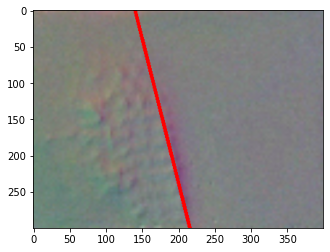

[0.47615045 0.5724043  0.36736488 0.86140716]


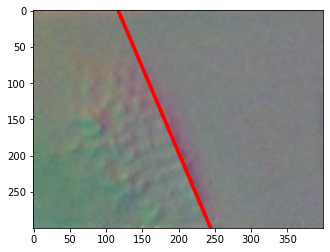

[0.48056313 0.5326613  0.5544707  0.7186208 ]


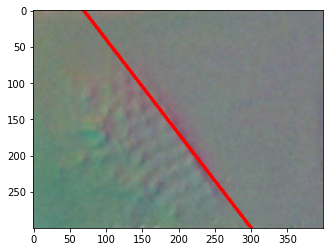

[0.4819536  0.4746545  0.5482312  0.69790006]


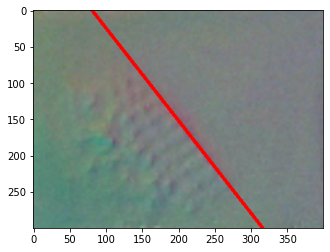

[0.4951334  0.49052256 0.5009409  0.7242718 ]


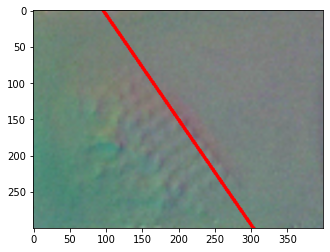

[0.51493084 0.47313255 0.3886775  0.7087823 ]


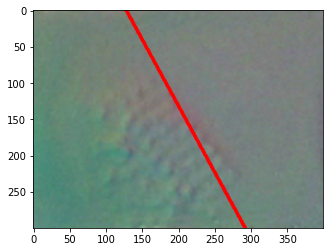

[0.53700316 0.48385012 0.42872503 0.7065292 ]


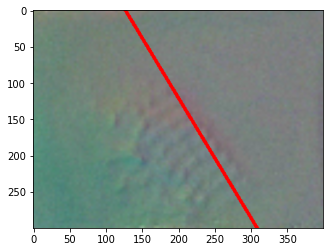

[0.5800753  0.4846648  0.48667777 0.68650997]


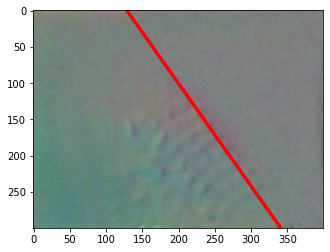

[0.6495415  0.5260575  0.2206693  0.72141445]


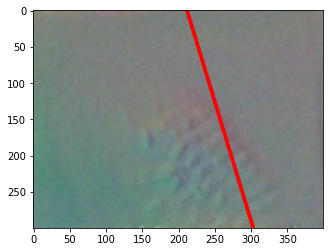

[ 0.6688677   0.5385024  -0.03518897  0.7078128 ]


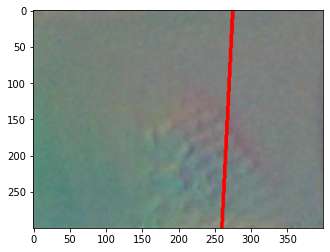

[0.6634062 0.4981541 0.2218417 0.6759059]


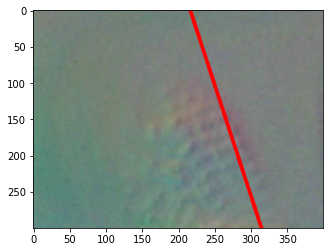

[0.64013326 0.4121326  0.37753624 0.79938555]


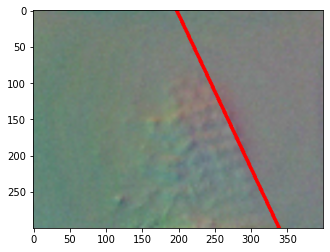

[0.62493545 0.38051966 0.32302648 0.87247074]


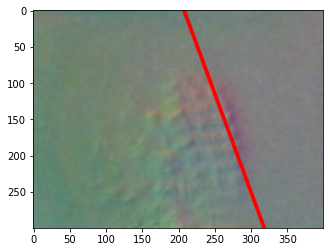

[0.5851569  0.40192404 0.19402371 0.87295973]


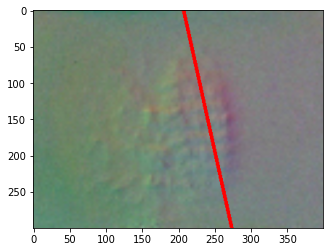

[0.54143584 0.37885547 0.1418024  0.8973448 ]


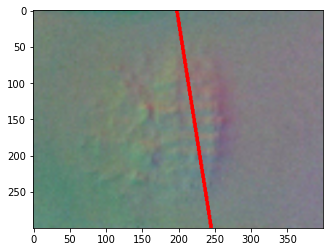

[0.5709893  0.33924833 0.05657705 0.9579812 ]


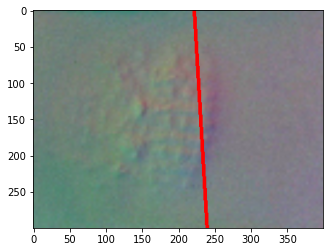

[0.5329672  0.3011528  0.06821751 0.93706596]


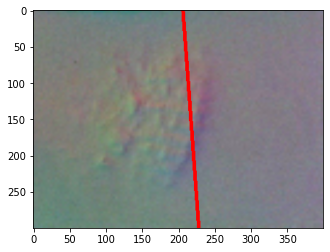

[ 0.49159393  0.339419   -0.06403845  0.9453001 ]


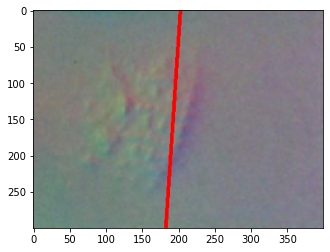

[ 0.49484265  0.3953916  -0.18404819  0.9282353 ]


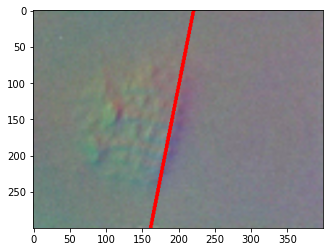

[ 0.48208565  0.39940667 -0.19120587  0.9446068 ]


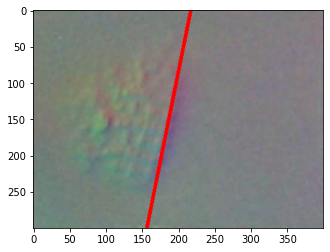

[ 0.45414904  0.39464802 -0.14796418  0.9360573 ]


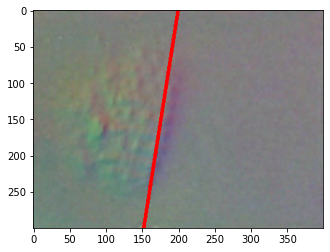

[ 0.43921056  0.42710876 -0.06457487  0.9358928 ]


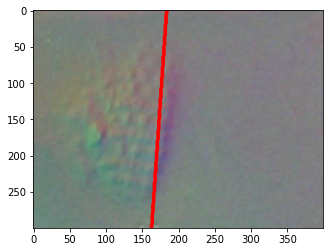

[ 0.4494729   0.5013902  -0.03576953  0.9149059 ]


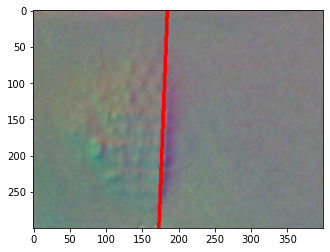

[0.47715315 0.5359445  0.2068041  0.9444599 ]


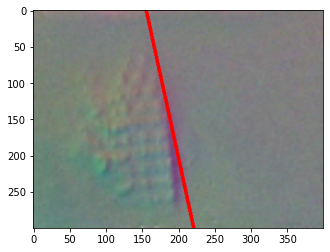

[0.4740221  0.5399523  0.24846198 0.9400697 ]


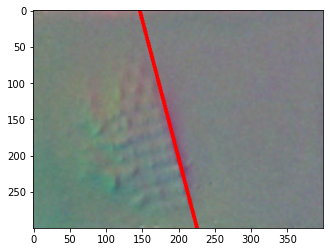

[0.44408074 0.49723628 0.38408566 0.87918997]


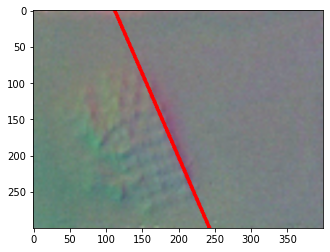

[0.4218334  0.454368   0.41742617 0.8279805 ]


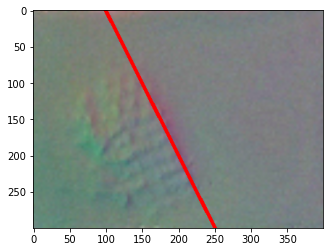

[0.42409924 0.46108252 0.45345482 0.78668845]


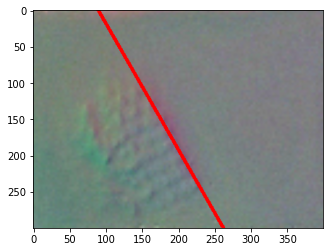

[0.4280423  0.48888737 0.53168094 0.75278413]


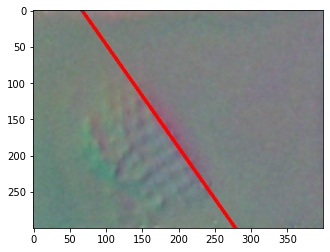

[0.44823298 0.5029547  0.42975858 0.72391737]


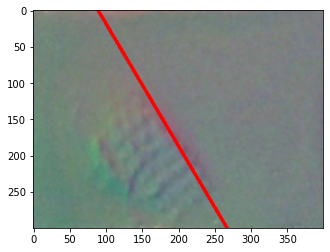

[0.45090967 0.52296245 0.6604453  0.61707807]


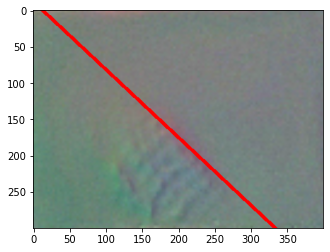

[0.49719507 0.5543164  0.48991537 0.6832199 ]


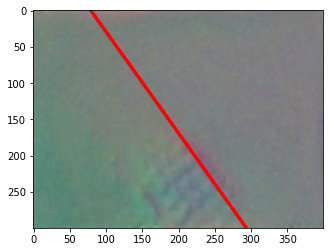

[0.50545585 0.5605508  0.45713428 0.6855906 ]


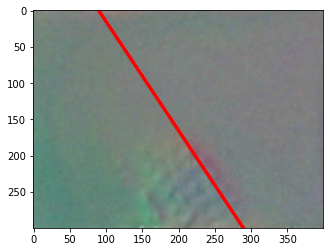

[0.50593674 0.5277452  0.37180585 0.7916368 ]


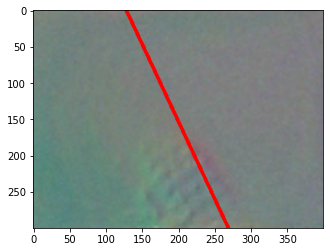

[0.49729273 0.49564475 0.482284   0.7875744 ]


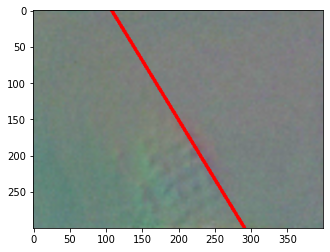

[0.4918503  0.49315062 0.39625657 0.7973188 ]


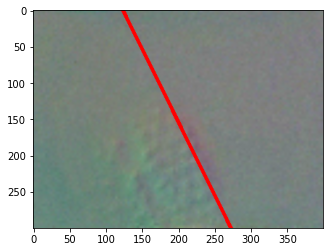

[0.50986326 0.48386133 0.13176677 0.93113697]


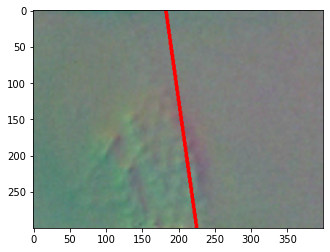

[0.49699572 0.47563207 0.09216226 0.93712413]


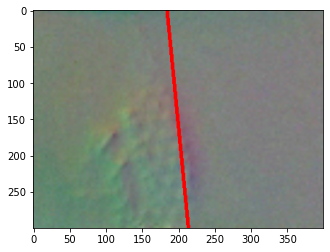

[0.45960438 0.40255073 0.18601541 0.9151213 ]


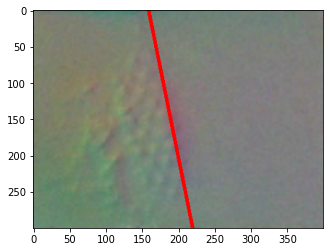

[0.43793607 0.35793257 0.22631021 0.905926  ]


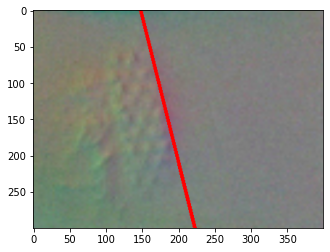

[0.43587327 0.40650856 0.1088891  0.9549111 ]


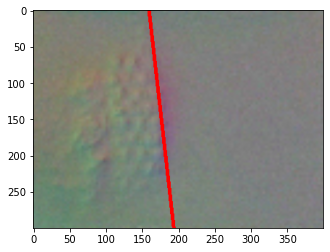

[0.39601395 0.42427748 0.15028845 0.9132823 ]


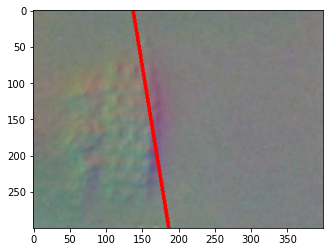

[0.38144767 0.49750534 0.05843722 0.9291285 ]


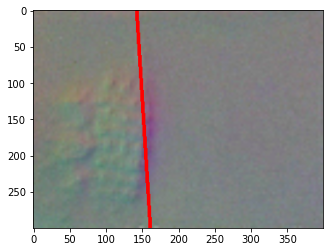

[0.35698614 0.5565829  0.03644067 0.95432365]


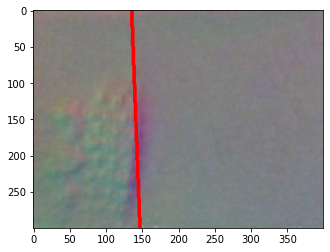

[ 0.33744186  0.6053218  -0.00148519  0.9337592 ]


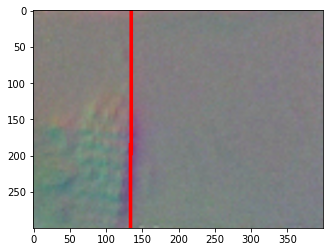

[0.34348562 0.58495367 0.00531233 0.9115237 ]


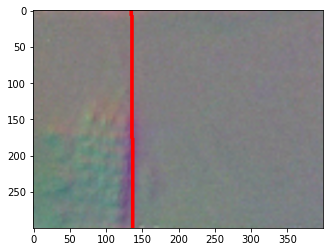

[0.35906905 0.5936011  0.05836931 0.9035704 ]


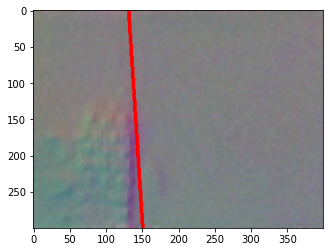

[0.36060244 0.6210387  0.2454115  0.90330625]


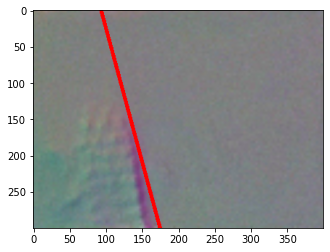

[0.32795942 0.62543285 0.49742046 0.86348677]


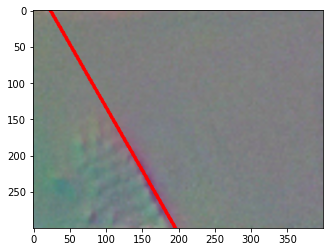

[0.33921522 0.63132364 0.6383639  0.79239935]


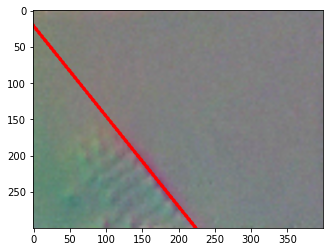

[0.35379744 0.6508876  0.75510466 0.6816157 ]


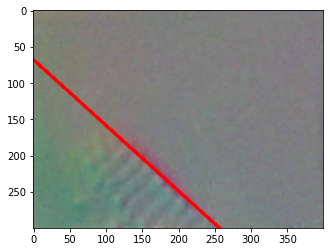

[0.37782004 0.64133334 0.8112531  0.6134    ]


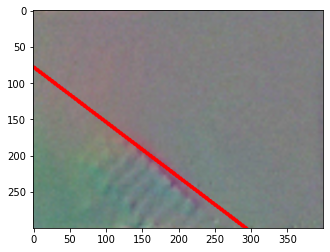

[0.39633128 0.6407206  0.83071584 0.6104609 ]


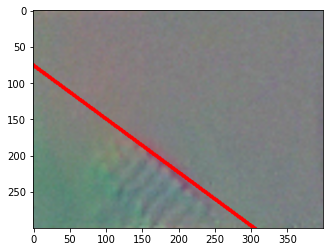

[0.41400254 0.6462411  0.83152956 0.5616231 ]


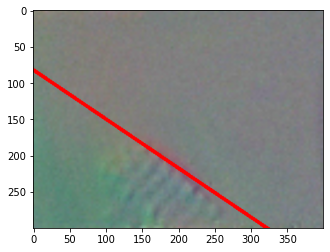

[0.45058653 0.6262845  0.79819286 0.5298715 ]


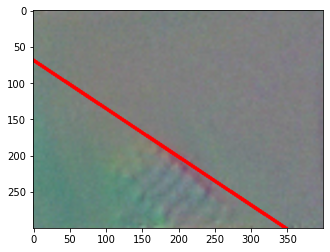

[0.44476387 0.5934365  0.7604649  0.50404096]


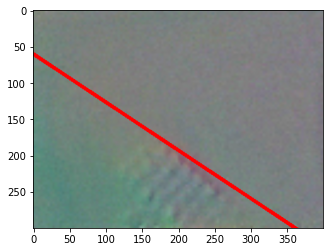

[0.44618678 0.494485   0.45399022 0.7367482 ]


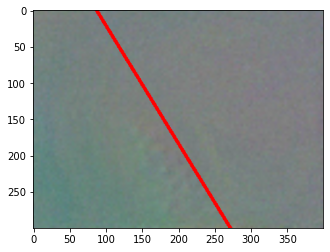

[ 0.5987904   0.55997264 -0.06084817  0.7078393 ]


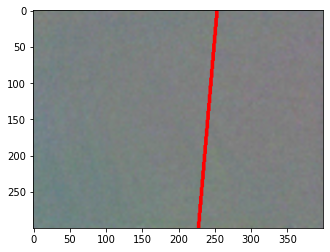

[ 0.6172109   0.57826775 -0.10954675  0.6695318 ]


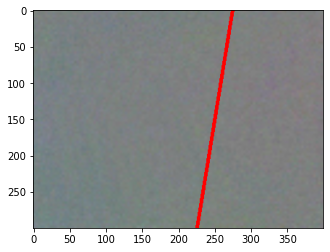

[ 0.5016641   0.6302162  -0.37299106  0.74530447]


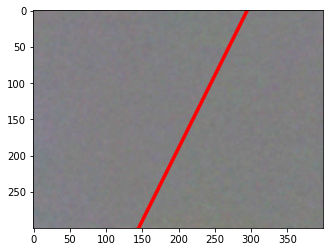

[ 0.48125398  0.61902726 -0.5204009   0.641152  ]


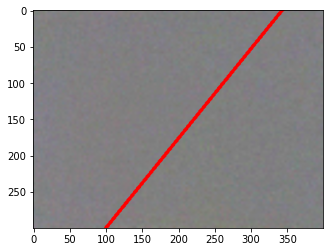

[ 0.502882    0.6200418  -0.33235428  0.73474455]


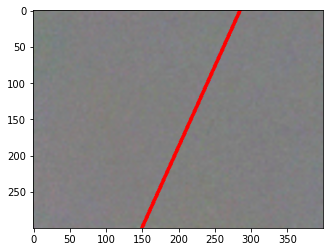

In [26]:
frame0 = frames[0]
# frame = frames[280]
frame = frames[460]

for _ in range(230, 680, 3):
    frame = frames[_]
    diff = (frame * 1.0 - frame0) / 255. * 4 + 0.5
    rendered_small = cv2.resize(diff, (120, 90))

    Y_pred = net.predict([rendered_small], device)
    i = 0
    x = rendered_small
    y = Y_pred[i]
    print(Y_pred[i])

    x = cv2.resize(x, (400, 300))
    theta = np.arctan2(y[2], y[3])
    rendered_img_line = draw_line(x, theta/np.pi*180., y[0], y[1])
    plt.figure()
    imshow(rendered_img_line)
